In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

Cloning into 'yolov5'...
remote: Enumerating objects: 13286, done.
remote: Total 13286 (delta 0), reused 0 (delta 0), pack-reused 13286
Receiving objects: 100% (13286/13286), 12.02 MiB | 14.31 MiB/s, done.
Resolving deltas: 100% (9250/9250), done.
/content/yolov5
     |████████████████████████████████| 596 kB 12.8 MB/s 
     |████████████████████████████████| 145 kB 12.9 MB/s 
     |████████████████████████████████| 178 kB 48.2 MB/s 
     |████████████████████████████████| 1.1 MB 48.7 MB/s 
     |████████████████████████████████| 67 kB 4.2 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 54.2 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datas

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="Yi1IqjzfXvYAwegmOX1r")
project = rf.workspace("new-workspace-shpnz").project("animaldetection-vqpkj")
dataset = project.version(5).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/AnimalDetection-5 in yolov5pytorch:: 100%|██████████| 639/639 [00:00<00:00, 1347.82it/s]


In [5]:
!python train.py --img 480 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/AnimalDetection-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=480, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [7]:
!python val.py --weights runs/train/exp/weights/best.pt --img 480 --conf 0.1 --data {dataset.location}/data.yaml

val: data=/content/datasets/AnimalDetection-5/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=480, conf_thres=0.1, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/datasets/AnimalDetection-5/valid/labels.cache' images and labels... 99 found, 0 missing, 1 empty, 0 corrupt: 100% 99/99 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:03<00:00,  1.27it/s]
                 all         99        112      0.933      0.831      0.906      0.779
                Bear         99          7          1      0.857      0.944      0.867
      

In [16]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 480 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/AnimalDetection-5/valid/images, data=data/coco128.yaml, imgsz=[480, 480], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/99 /content/datasets/AnimalDetection-5/valid/images/20210501164005073_UTC_jpg.rf.7a9c743ee5e732e6ab0875eccfc33b91.jpg: 384x480 1 Human, Done. (0.023s)
image 2/99 /content/datasets/AnimalDetection-5/valid/images/20210501164006639_UTC_jpg.rf.8e1c9dde915d90104129bfed628e0072.jpg: 384x480 1 Human, Done. (0.023s)
image 3/99 /content/datase

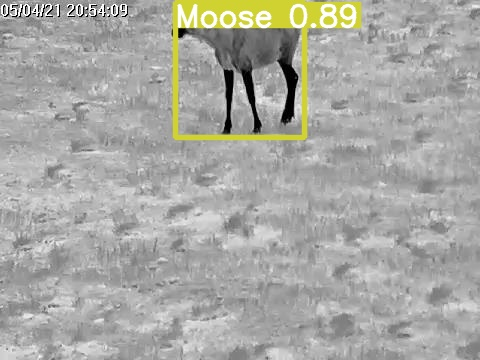

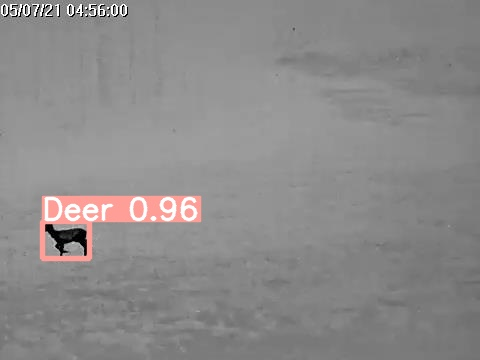

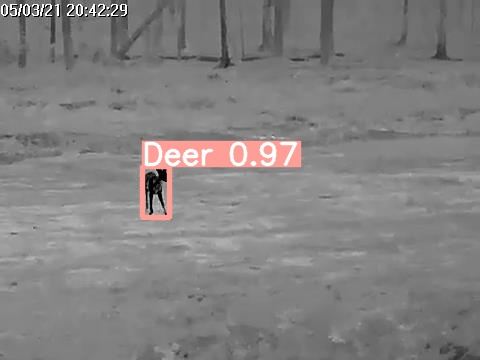

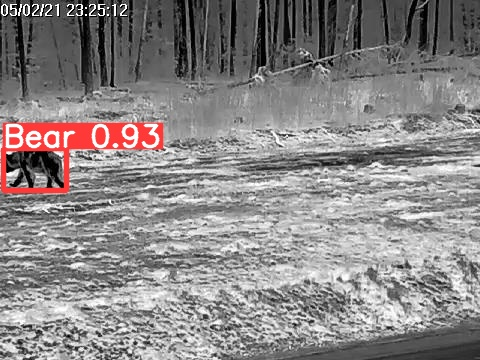

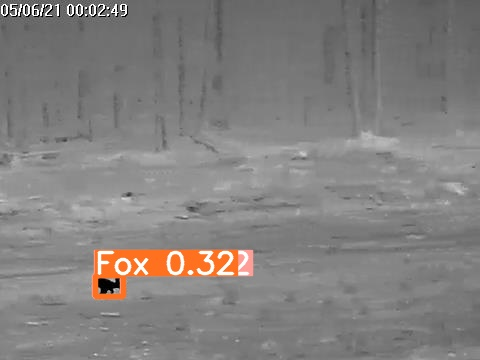

...

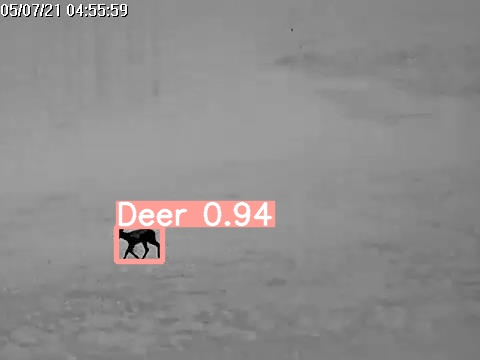

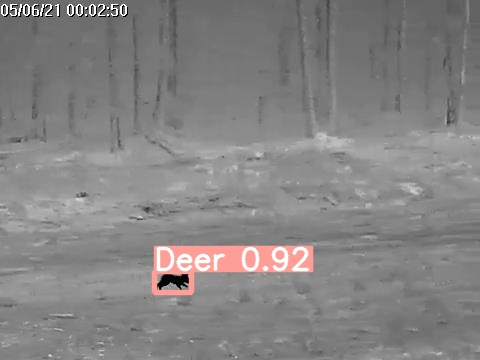

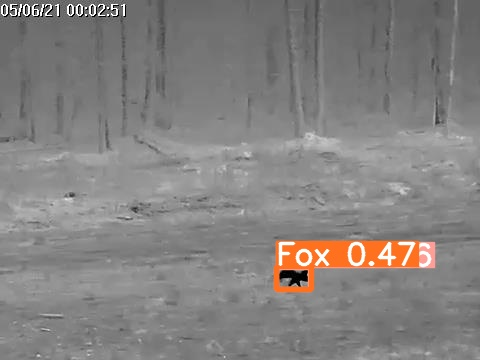

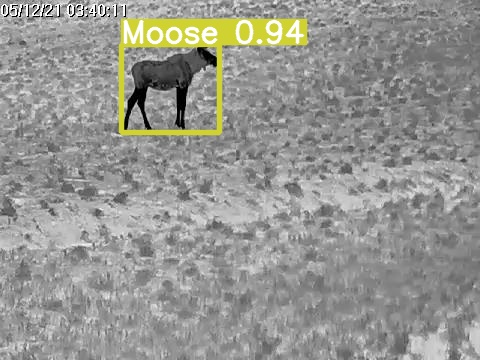

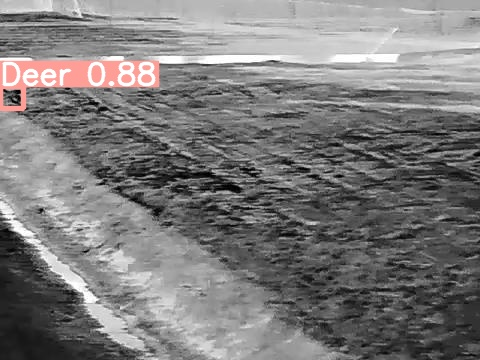

In [17]:
#display inference

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp7/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#export model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>